In [ ]:
#Code by https://www.tensorflow.org/hub/tutorials/tf2_arbitrary_image_stylization
import functools
import os

from matplotlib import gridspec
import matplotlib.pylab as plt
import numpy as np
import tensorflow as tf
import tensorflow_hub as hub
from LPIPS import LPIPS
import torch
import time

print("TF Version: ", tf.__version__)
print("TF Hub version: ", hub.__version__)
print("Eager mode enabled: ", tf.executing_eagerly())
print("GPU available: ", tf.config.list_physical_devices('GPU'))

/opt/anaconda3/envs/TFenv/lib/python3.10/site-packages/tensorflow_hub/__init__.py:61: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import parse_version


TF Version:  2.15.0
TF Hub version:  0.15.0
Eager mode enabled:  True
GPU available:  []


In [2]:
# @title Define image loading and visualization functions  { display-mode: "form" }

def crop_center(image):
  """Returns a cropped square image."""
  shape = image.shape
  new_shape = min(shape[1], shape[2])
  offset_y = max(shape[1] - shape[2], 0) // 2
  offset_x = max(shape[2] - shape[1], 0) // 2
  image = tf.image.crop_to_bounding_box(
      image, offset_y, offset_x, new_shape, new_shape)
  return image

@functools.lru_cache(maxsize=None)
def load_image(path, image_size=(256, 256), preserve_aspect_ratio=True):
  image_path = path
  # Load and convert to float32 numpy array, add batch dimension, and normalize to range [0, 1].
  img = tf.io.decode_image(
      tf.io.read_file(image_path),
      channels=3, dtype=tf.float32)[tf.newaxis, ...]
  # img = crop_center(img)
  img = tf.image.resize(img, image_size, preserve_aspect_ratio=False)
  return img


def show_n(images, titles=('',)):
  n = len(images)
  image_sizes = [image.shape[1] for image in images]
  w = (image_sizes[0] * 6) // 320
  plt.figure(figsize=(w * n, w))
  gs = gridspec.GridSpec(1, n, width_ratios=image_sizes)
  for i in range(n):
    plt.subplot(gs[i])
    plt.imshow(images[i][0], aspect='equal')
    plt.axis('off')
    plt.title(titles[i] if len(titles) > i else '')
  plt.show()

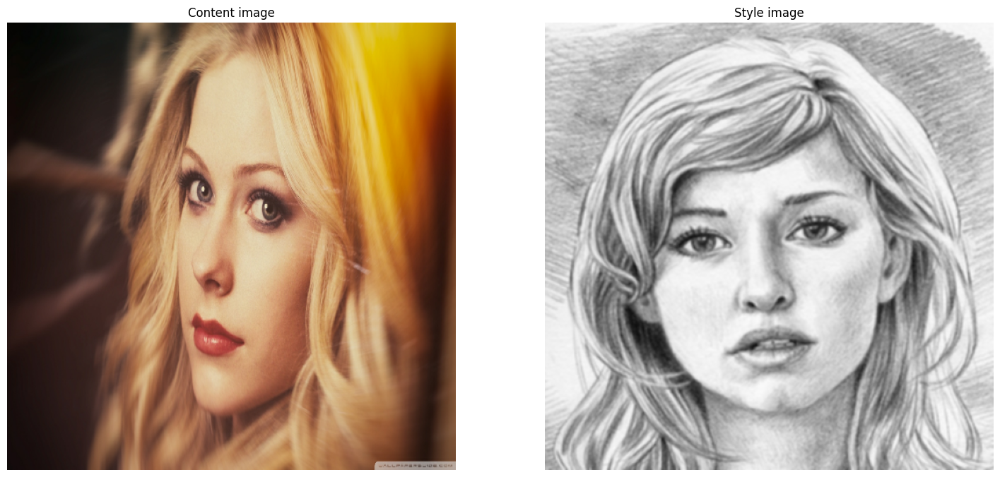

In [3]:
image_path = "content/avril.jpg"
style_path = "style/sketch.png"

content_img_size = (512, 512)

style_img_size = (512, 512) 

content_image = load_image(image_path, content_img_size)
style_image = load_image(style_path, style_img_size)
style_image = tf.nn.avg_pool(style_image, ksize=[3,3], strides=[1,1], padding='SAME')
show_n([content_image, style_image], ['Content image', 'Style image'])

In [4]:
# Load TF Hub module.

hub_handle = 'https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2'
hub_module = hub.load(hub_handle)

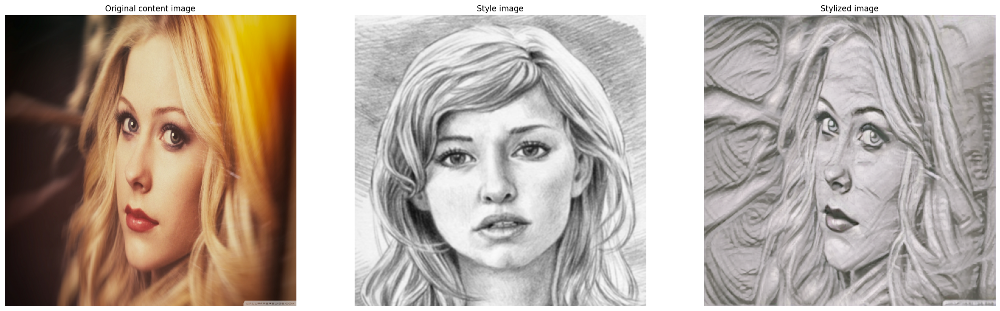

In [5]:
# Visualize input images and the generated stylized image.
# Stylize content image with given style image.
# This is pretty fast within a few milliseconds on a GPU.

outputs = hub_module(tf.constant(content_image), tf.constant(style_image))
stylized_image = outputs[0]

show_n([content_image, style_image, stylized_image], titles=['Original content image', 'Style image', 'Stylized image'])

In [6]:
def conversion(image):
    #Convert to torch 
    numpyImg = image.numpy()
    torchImg = torch.from_numpy(numpyImg)
    img = torchImg.permute(0,3,1,2)
    normalisedImg = img* 2.0 - 1.0
    return normalisedImg

def evaluate(content, style):
    lpips = LPIPS()
    score = lpips.eval(conversion(content), conversion(style))
    return score
    
evaluate(content_image,stylized_image)

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/envs/TFenv/lib/python3.10/site-packages/lpips/weights/v0.1/alex.pth


/opt/anaconda3/envs/TFenv/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/anaconda3/envs/TFenv/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


0.7151772379875183

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/envs/TFenv/lib/python3.10/site-packages/lpips/weights/v0.1/alex.pth


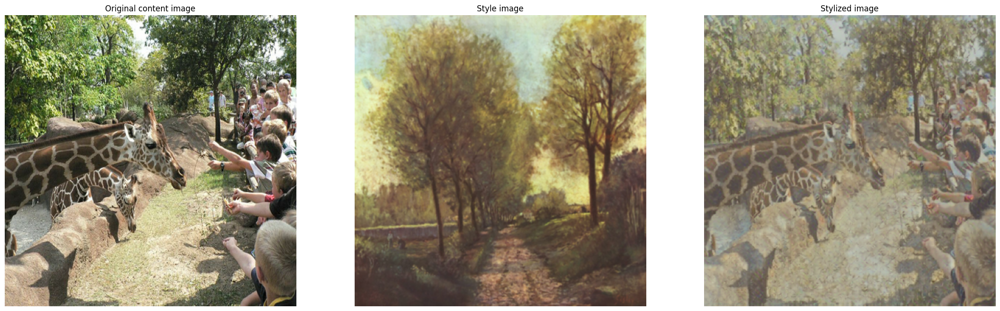

0.3703804314136505 660.6344169995282


In [7]:
def analysis(cNum,sNum, savedName = "Magenta"):

    style = f"Test/Style/Style-{sNum}.jpg"
    content = f"Test/Content/Content-{cNum}.jpg"

    content_image = load_image(content, (512,512))
    style_image = load_image(style, (512,512))
    style_image = tf.nn.avg_pool(style_image, ksize=[3,3], strides=[1,1], padding='SAME')
    start = time.perf_counter()
    outputs = hub_module(tf.constant(content_image), tf.constant(style_image))
    end = time.perf_counter()
    stylized_image = outputs[0]
    
    score = evaluate(content_image,stylized_image)

    show_n([content_image, style_image, stylized_image], titles=['Original content image', 'Style image', 'Stylized image'])

    save_img = stylized_image[0].numpy()
    save_img = np.clip(save_img, 0.0, 1.0)
    
    plt.imsave(f"output/{savedName}.jpg", save_img)

    print(score, (end-start) * 1000)
    return score, (end-start)*1000

score1, time1 = analysis(1,1, "Magenta-output-1")

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/envs/TFenv/lib/python3.10/site-packages/lpips/weights/v0.1/alex.pth


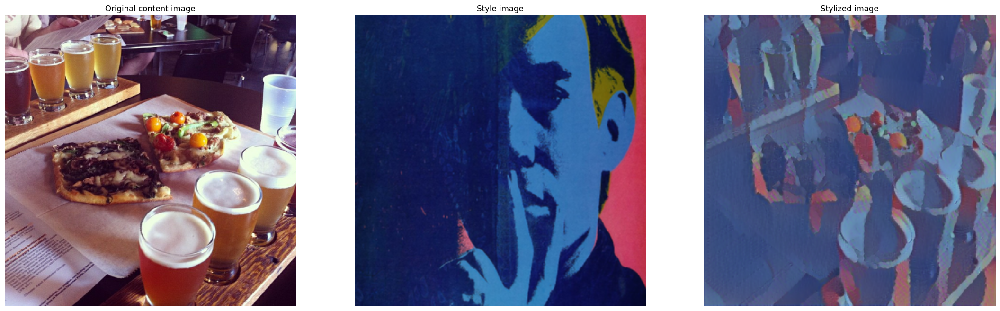

0.6292423009872437 653.9202089988976


In [8]:
score2, time2 = analysis(2,2, "Magenta-output-2")

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/envs/TFenv/lib/python3.10/site-packages/lpips/weights/v0.1/alex.pth


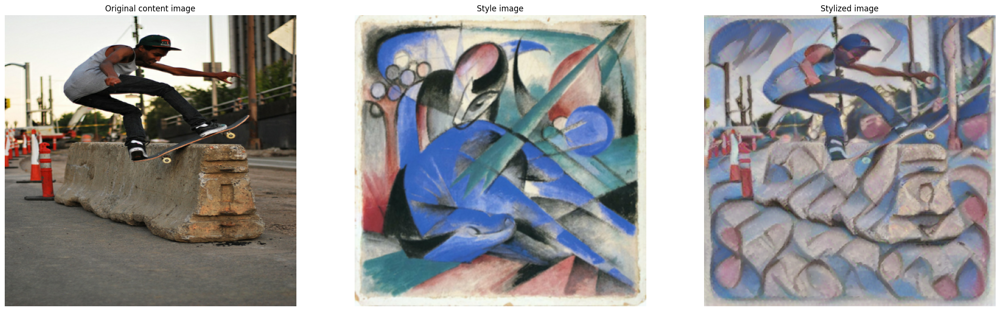

0.5900537967681885 663.1091250019381


In [9]:
score3, time3 = analysis(3,3, "Magenta-output-3")

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/envs/TFenv/lib/python3.10/site-packages/lpips/weights/v0.1/alex.pth


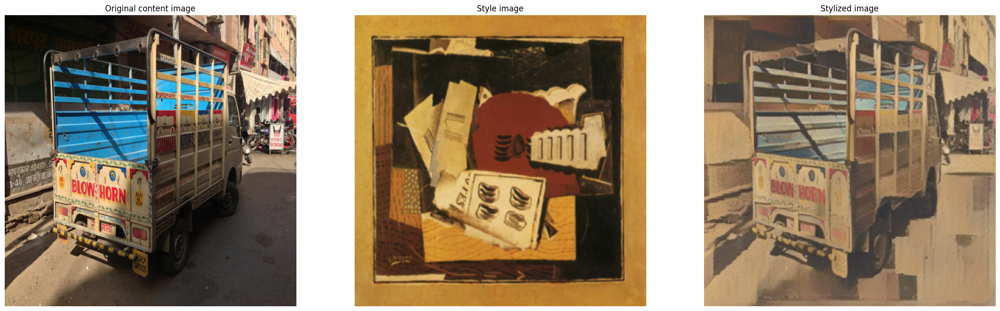

0.4308265745639801 673.446499997226


In [10]:
score4, time4 = analysis(4,4, "Magenta-output-4")

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/envs/TFenv/lib/python3.10/site-packages/lpips/weights/v0.1/alex.pth


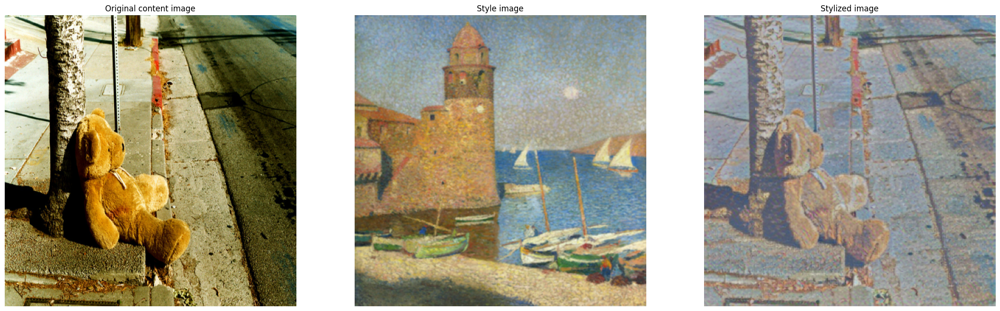

0.5360821485519409 660.6249159958679


In [22]:
score5, time5 = analysis(5,5, "Magenta-output-5")

In [24]:
scores = np.array([score1,score2,score3,score4,score5])
np.mean(scores)

0.5113170504570007

In [26]:
times = np.array([time1,time2,time3,time4,time5])
np.mean(times)

662.3470333986916